<a href="https://www.kaggle.com/code/ifeanyichukwunwobodo/goodreads-recommendation-sytem-using-fastai?scriptVersionId=133897795" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# INTRODUCTION

One common problem to solve is having a number of users and a number of products, and you want to recommend which products are most likely to be useful for which users. This is true for Netflix movie recommendations, spotify music recommendations, targeted Youtube ads (and even their video recommendation and many more.

In simple terms, recommendation systems/engine are systems that are designed to recommend items to the user based on many different factors.

In this notebook you will learn how to create a recommedation system or engine using Fastai. You would also learn how to get deeper insights using recommendation system which cannot be obtained using explorative data analysis or basic machine learning techniques.



In [1]:
#Unhash if fastai is not installed in your local device
#!pip install fastai 

In [2]:
import pandas as pd
import numpy as np
from fastai.collab import *
from fastai.tabular.all import *
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import plotly.io as pio
pio.templates.default ='presentation'

In [3]:
pio.templates

Templates configuration
-----------------------
    Default template: 'presentation'
    Available templates:
        ['ggplot2', 'seaborn', 'simple_white', 'plotly',
         'plotly_white', 'plotly_dark', 'presentation', 'xgridoff',
         'ygridoff', 'gridon', 'none']

# THE DATASET

We are going to use a dataset on Goodreads user ratings.

**What is Goodreads?**

Goodreads is the world's largest site for readers and book recommendations. It is a social platform that connects readers to books and eaxch other.  It is a subsidiary of amazon that allow users to search its database of books, annotations, quotes, and reviews. It is more or less an online library as users can register books to generate library catalogs and reading lists. It was founded by Otis Chandler and Elizabeth Khuri Chandler in 2007. By 2019, the site had 90 million members and 50 million use reviews.

It helps users to keep track of what they are reading and allow them write book reviews. Once you rate books or mark them as read, Goodreads will recommend new books for you to read.

In [4]:
#rl to get the data
url = "https://datascience.quantecon.org/assets/data/goodreads_ratings.csv.zip"
#Import the dataset tratings dataset
ratings = pd.read_csv(url, index_col=[0])
# let's look at the first few rows of the dataset
display(ratings.head())
# the rows and columns of the dataset
ratings.shape

,user_id,book_id,rating
0,1,258,5
1,2,4081,4
2,2,260,5
3,2,9296,5
4,2,2318,3


(5976479, 3)

The data used for this project was obtained from quantecon. The dataset contains information on Goodreads ratings of various users (`user_id`) as well as the unique id of the books (`book_id`). 

The `user_id` feature is a unique identifier for each user.

The `book_id` feature is a unique identifier for each book.

The `rating` feature the ratings given by a user for a particular book.

The books will be easier to identify with the titles rather than the `book_id`. 
To get the title of the book we use another data sourced from quantecon which gives more information for the books given their unique id.

In [5]:
url = "https://datascience.quantecon.org/assets/data/goodreads_books.csv"
books = pd.read_csv(url)
# we only need a few of the columns
books = books[["book_id", "authors", "title"]]
print("shape: ", books.shape)
books.head()

shape:  (10000, 3)


,book_id,authors,title
0,1,Suzanne Collins,"The Hunger Games (The Hunger Games, #1)"
1,2,"J.K. Rowling, Mary GrandPré","Harry Potter and the Sorcerer's Stone (Harry Potter, #1)"
2,3,Stephenie Meyer,"Twilight (Twilight, #1)"
3,4,Harper Lee,To Kill a Mockingbird
4,5,F. Scott Fitzgerald,The Great Gatsby


You can see some familiar names already.

There are 10,000 unique books and 3 unique information (`book_id`, `authors` and `title`) in the books dataset. 

`book_id` is the same as defined earlier.

`authors` is/are the author(s) of the particular book.

 `title`is the title of the book given the `book_id`.
 
 Although the two tables are important they are useless individually. Let's merge the two datasets.

In [6]:
#merge the two datasets
rated_books = pd.merge(ratings, books)


# let's save the merged dataset
rated_books.to_csv('books.csv', index=False)

In [7]:
rated_books = pd.read_csv('books.csv')

#let's see the first few rows
display(rated_books.head())
rated_books.shape

,user_id,book_id,rating,authors,title
0,1,258,5,"Carlos Ruiz Zafón, Lucia Graves","The Shadow of the Wind (The Cemetery of Forgotten Books, #1)"
1,11,258,3,"Carlos Ruiz Zafón, Lucia Graves","The Shadow of the Wind (The Cemetery of Forgotten Books, #1)"
2,143,258,4,"Carlos Ruiz Zafón, Lucia Graves","The Shadow of the Wind (The Cemetery of Forgotten Books, #1)"
3,242,258,5,"Carlos Ruiz Zafón, Lucia Graves","The Shadow of the Wind (The Cemetery of Forgotten Books, #1)"
4,325,258,4,"Carlos Ruiz Zafón, Lucia Graves","The Shadow of the Wind (The Cemetery of Forgotten Books, #1)"


(5976479, 5)

The merged dataset has a total of 5 columns.

In [8]:
rated_books.columns

Index(['user_id', 'book_id', 'rating', 'authors', 'title'], dtype='object')

# EXPLORATIVE DATA ANALLYSIS

In [9]:
# checking for missing values in the dataset
rated_books.isna().sum().any()

False

There are no missing values in this dataset.

In [10]:
#Checking the data type
rated_books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5976479 entries, 0 to 5976478
Data columns (total 5 columns):
 #   Column   Dtype 
---  ------   ----- 
 0   user_id  int64 
 1   book_id  int64 
 2   rating   int64 
 3   authors  object
 4   title    object
dtypes: int64(3), object(2)
memory usage: 228.0+ MB


The `book_id` and `user_id` columns are of the wrong datatype.

In [11]:
# Assigning to the correct datatype
rated_books['user_id'] = rated_books.user_id.astype('object')
rated_books['book_id'] = rated_books.book_id.astype('object')

In [12]:
# Descriptive statistics
rated_books.describe()

,rating
count,5.976479e+06
mean,3.919866e+00
std,9.910868e-01
min,1.000000e+00
25%,3.000000e+00
50%,4.000000e+00
75%,5.000000e+00
max,5.000000e+00


In [13]:
# Descriptive statistics of categorical columns
rated_books.describe(include='object')

,user_id,book_id,authors,title
count,5976479,5976479,5976479,5976479
unique,53424,10000,4664,9964
top,30944,1,"J.K. Rowling, Mary GrandPré","The Hunger Games (The Hunger Games, #1)"
freq,200,22806,99518,22806


There are a total of 52585 users in this dataset. There are a total of 2,187,910 ratings in our dataset with 716 unique authors (note that some authors are counted more than once if they coauthored another book) and 1263 books.
The most read book is the first part of the Harry Potter Series by J.K Rowlings and Mary GrandPré which have been read 21,850 by these users. J.K Rowlings and Mary GrandPré appeared more often in the dataset suggesting that these pair went on to write a couple more books after this one or have written another before this.  

In [14]:
jk_mg = rated_books[rated_books['authors'].str.contains('J.K. Rowling, Mary GrandPré')]
jk_mg.head()

,user_id,book_id,rating,authors,title
52696,4,18,5,"J.K. Rowling, Mary GrandPré, Rufus Beck","Harry Potter and the Prisoner of Azkaban (Harry Potter, #3)"
52697,15,18,4,"J.K. Rowling, Mary GrandPré, Rufus Beck","Harry Potter and the Prisoner of Azkaban (Harry Potter, #3)"
52698,31,18,3,"J.K. Rowling, Mary GrandPré, Rufus Beck","Harry Potter and the Prisoner of Azkaban (Harry Potter, #3)"
52699,24,18,3,"J.K. Rowling, Mary GrandPré, Rufus Beck","Harry Potter and the Prisoner of Azkaban (Harry Potter, #3)"
52700,58,18,5,"J.K. Rowling, Mary GrandPré, Rufus Beck","Harry Potter and the Prisoner of Azkaban (Harry Potter, #3)"


This shows that our conjecture were correct. Although it seems that they only wrote books within the series. 

In [15]:
# Bpooks by J.K. Rowling, Mary GrandPré, 
jk_mg.title.unique()

array(['Harry Potter and the Prisoner of Azkaban (Harry Potter, #3)',
       'Harry Potter and the Half-Blood Prince (Harry Potter, #6)',
       'Harry Potter and the Order of the Phoenix (Harry Potter, #5)',
       "Harry Potter and the Sorcerer's Stone (Harry Potter, #1)",
       'Harry Potter and the Chamber of Secrets (Harry Potter, #2)',
       'Harry Potter and the Goblet of Fire (Harry Potter, #4)',
       'Harry Potter and the Deathly Hallows (Harry Potter, #7)',
       'Harry Potter Boxed Set, Books 1-5 (Harry Potter, #1-5)',
       'The Harry Potter Collection 1-4 (Harry Potter, #1-4)'],
      dtype=object)

In [16]:
#Number of Unique Values
fig = px.bar(rated_books.nunique().sort_values(ascending=False), title='Number of Unique Values', text_auto=True)
fig.update_layout(showlegend=False, yaxis_title="", xaxis_title="Features") 
fig.update_yaxes(showgrid=False, showticklabels=False)


In [17]:
#Distribution of ratings
fig = px.histogram(rated_books.rating, title='Distribution of Ratings')
fig.update_layout(showlegend=False, xaxis_title='Rating')
fig.add_vline(rated_books.rating.mean(), 
              annotation_text=f'mean rating({round(rated_books.rating.mean(),2)})',
              line_dash = 'dot',
              annotation_position='top right')
fig.update_xaxes(showgrid=False)

Goodreads uses 5-point rating. The ratings are skewed to high values. This shows that the mean rating is approximately 4. This means that the ratings are generally positive.

In [18]:
fig = px.bar(rated_books["authors"].value_counts()[:5].sort_values(),
             text_auto=True, 
             title='Most Read Authors',
             orientation='h')
fig.update_layout(showlegend=False, xaxis_title="")
fig.update_xaxes(showticklabels=False, showgrid=False, showline=False, ticks='')
fig.update_yaxes(showline=False, ticks='', automargin=True)

As mentioned earlier, J.K. Rowling and Mary GrandPre are the most read authors followed by Stephen King, J.R Tolkein, Josh Grisham and C.S Lewis (in that order).

In [19]:
fig = px.bar(rated_books["authors"].value_counts()[-5:].sort_values(),
             text_auto=True, 
             title='Least Read Authors',
             orientation='h')
fig.update_layout(showlegend=False, xaxis_title="")
fig.update_xaxes(showticklabels=False, showgrid=False, showline=False, ticks='')
fig.update_yaxes(showline=False, ticks='', automargin=True)

In [20]:
fig = px.bar(rated_books["title"].value_counts()[:5].sort_values(),
             text_auto=True, 
             title='Most Read Books',
             orientation='h')
fig.update_layout(showlegend=False, xaxis_title="", yaxis_title='Book')
fig.update_xaxes(showticklabels=False, showgrid=False, showline=False, ticks='')
fig.update_yaxes(showline=False,showgrid=False, ticks='', automargin=True)

Let's look at the ratings of the most active and least active users.

In [21]:
#ratings per users
n_ratings = rated_books["user_id"].value_counts()
n_ratings.head()


30944    200
12874    200
28158    199
52036    199
12381    199
Name: user_id, dtype: int64

In [22]:
most_prolific_users = n_ratings.nlargest(10).index.tolist()
least_prolific_users = n_ratings.nsmallest(10).index.tolist()

In [23]:
# step 2
active_ratings = rated_books.loc[rated_books["user_id"].isin(most_prolific_users), :]
inactive_ratings = rated_books.loc[rated_books["user_id"].isin(least_prolific_users), :]

In [24]:
# ratngs of the most active users
fig = px.bar(active_ratings["rating"].value_counts(), text_auto='count',title='Active Users Ratings')
fig.update_layout(showlegend=False, yaxis_title="")
fig.update_yaxes(showticklabels=False, showgrid=False)

The most active users mostly give a rating of 4 withh 638 ratings in total. The active users generally give high ratings as the ratings are skwed to positive ratings.

In [25]:
# Inactive Users Ratings
fig = px.bar(inactive_ratings["rating"].value_counts(), text_auto=True, title='Inactive Users Ratings')
fig.update_layout(showlegend=False, yaxis_title="")
fig.update_yaxes(showticklabels=False, showgrid=False)

Inactive users also tends to give high rating.

In [26]:
# Books with the highest average ratings
average_ratings = (
    rated_books
    .pivot_table(values="rating", index="title")
    
)
average_ratings.sort_values(by="rating", ascending=False)[:5]

,rating
title,
The Complete Calvin and Hobbes,4.829876
ESV Study Bible,4.818182
Attack of the Deranged Mutant Killer Monster Snow Goons,4.768707
The Indispensable Calvin and Hobbes,4.766355
The Revenge of the Baby-Sat,4.761364


Calvin and Hobbes series have the highest average ratings.

In [27]:
# Authors with the highest average ratings
author_ratings = (
    rated_books
    .pivot_table(values="rating", index="authors")
     )
fig = px.bar(author_ratings.sort_values(by="rating")[:10], 
             text_auto=True, 
             orientation='h',
             title='Authors With Highest Average Ratings')
fig.update_layout(showlegend=False,xaxis_title='', yaxis_title='Authors')
fig.update_xaxes(showticklabels=False, showgrid=False, showline=False, ticks='')
fig.update_yaxes( showline=False, ticks='',automargin=True)

The most read authors with the highest average ratings are not necessary among the most read authors

Information about positive audience (biblophile) can be used to generate targeted ads and customer segmentation. The basic way of detecting these users is by calculating their average ratings. 

In [28]:
# Users who gives the highest average ratings
user_ratings = rated_books.groupby('user_id')['rating'].mean()
user_ratings.sort_values(ascending=False)[:10]
 

user_id
52039    5.0
12912    5.0
44637    5.0
23085    5.0
8643     5.0
44540    5.0
30159    5.0
51849    5.0
5920     5.0
44436    5.0
Name: rating, dtype: float64

This does not give any insight on the users as many users have an average rating equal to 5. Next, we will see how we can use collaborative filtering to get insight about generally positive users.

# RECOMMENDATION ENGINE

We are going to use fastai collaborative filtering to create recommendation engine.

Collaborative filtering works by finding which products the current user has used or liked (in this case books the user has given a high rating), then find other users who have used or liked (given a high rating to)similar products, and then recommend other products that those users have used or liked.
 That is, if a user x like book a, the algorithm will find user y who likes a book similar (same) to book  a and recommend any other book user y likes to user x.
Although collaborative filtering are mostly used for recommendation engines, they can also be used to get deeper insight about users preference. 

There are two major methods to perform collaborative filtering, the probabilistic matrix function (PMF) and the deep learning approach. W e are going to focus on PMF.

First we will start by creating a dataloader for collaborative filtering from the merged dataset

In [29]:
dls = CollabDataLoaders.from_df(rated_books, item_name='title')
dls.show_batch()

,user_id,title,rating
0,32135,The Hobbit,5
1,5447,Holy Bible: King James Version,5
2,28,Heart of Darkness,5
3,5697,"The Lightning Thief (Percy Jackson and the Olympians, #1)",4
4,43501,Anna Karenina,3
5,40626,The Name of the Rose,5
6,18048,"The Tombs of Atuan (Earthsea Cycle, #2)",1
7,2291,The House at Riverton,4
8,9464,Where the Wild Things Are,5
9,27307,Romeo and Juliet,4


The dataloader only includes the  neccessary columns for collaborative filtering and it chooses automatically based on the arrangement of the dataset. The first columns is chosen as the user identifier (`user_id`) column, the second column as the item identifier (`title`) and the third column as the `rating`. If your dataset does not follow this arrangement, you will have to identify them by passing `user_name`, `item_name` and `rating` argument to CollabDataLoaders. The item name (book title) was only specified because it did not follow the arrangement.

Additionally, we can now fit collab_learner with the dataloader. We are going to use a probabilistic Matrix Factorization (PMF)

In [30]:
#Fit the collab_learner
learn = collab_learner(dls, y_range=(0,5.5), n_factors=50)
'''
dls is the data loader,
y_range is the range of rating
(the upper limit is slightly higher than the maximum because this has been shown to improve results)
'''
learn.fit_one_cycle(5, 5e-3, wd=0.1)

epoch,train_loss,valid_loss,time
0,1.126001,1.127785,42:40
1,1.107156,1.129031,49:28
2,1.044349,1.056506,47:30
3,0.954677,0.954013,43:18
4,0.917531,0.903794,38:45


In [31]:
# export the model
learn.export('goodread_rec.pkl')

**How does this PMF work?**

The model finds the underlying characteristics (latent factors) of the books (items) like if the book is young adult, fantasy, science fiction and so on) and the user (if they like reading the sci-fi, romance and so on) and represents these characteristics in numeric form. These latent factors can be represented of the user and products are then multiplied with each other. If a high value is obtained, then the product and user are a good match.

This begs the question **how do we find the latent factor of the user or item?**

We can do that by finding the embedding weight of each product and user. This is what embeddings are. We will attribute to each of our users and each of our books a random vector of a certain length (here, 50), and we will make those learnable parameters. That means that at each step, when we compute the loss by comparing our predictions to our targets, we will compute the gradients of the loss with respect to those embedding vectors and update them with the rules of stochastic gradient descent (SGD) (or another optimizer).

In simpler terms, we will assign 50 random vectors to each users and each books and turm those random numbers to parameters and use stochastic gradient descent to optimize those parameters.

In [32]:
"""
for example lets say a user have the following latent factor
The latent factors represent the user preference, here [romance, fantasy]
"""
# Let's give an example of a user who is a lover of fantasy book with little romance
user_lat = np.array([0.2, 0.9])


This user has a 20% love for romance and 90% love for romance. Let's give an example where the algorithm wants to recommend between Harry potter (`harry_lat`) and the Fault in our star. We will make some assumption about the latent factors and compare the result of the dot product of each item latent factors with that of the user.

In [33]:
harry_lat = np.array([0.2, 0.9])
print (f' Harry Potter Dot Product {round((user_lat @ harry_lat),2)}')

fios_lat = np.array([0.9, 0.1])
print (f' Fault in Our Stars Dot Product {(user_lat @ fios_lat)}')

 Harry Potter Dot Product 0.85
 Fault in Our Stars Dot Product 0.27


The model will recommend Harry Potter to the user because they are a more even match (the dot product of the latent factors is higher than that of fios).

In [34]:
learn = load_learner('goodread_rec.pkl')
learn.model

EmbeddingDotBias(
  (u_weight): Embedding(53425, 50)
  (i_weight): Embedding(9965, 50)
  (u_bias): Embedding(53425, 1)
  (i_bias): Embedding(9965, 1)
)

The model consists of 4 layers. Weight represents the latent factors (i_weight is item weights and u_weights is user weights).

What is new to us here is the bias. Some users are just more positive or negative in their recommendations than others, and some books are just plain better or worse than others irrespective of their genre, date of publication e.t.c. 
If we have a single number for each user that we can add to our scores, and do the same for each book, that will handle the bias. In our model, this represented by `Embedding(52586, 1)` for user bias and `Embedding(1264, 1)` for item bias.

The model can be utilized to get the bias for a specific user. Let's see an example using the most active user we saw earlier. 

In [35]:
# Get the user bias values
user_bias = learn.model.u_bias.weight
# Specify 
user_index = 33065 

# Get the bias for the specified user
user_bias_value = user_bias[user_index]

# Print the bias value
print("Bias for user", user_index, ":", user_bias_value)

Bias for user 33065 : tensor([0.0326], grad_fn=<SelectBackward0>)


The bias of the model can be used to get deeper insight about the dataset. It can be used to show the users preference even if their books latent factors does not match that of the user.

For example books with the highest bias shows even when a user does not match the latent factors of these books ( latent factors represent things like level of action, age of books, genre, target audience and so forth), they still tend to like this books.

This is best explained with an example.

In [36]:
# Get the bias of the books
books_bias = learn.model.i_bias.weight.squeeze()

# Find the index of books with the top 5 highest bias 
idxs = books_bias.argsort(descending=True)

# Get the title of these books in the dataloader
high_bias = list(dls.classes['title'][idxs][:5])
high_bias

['Harry Potter and the Deathly Hallows (Harry Potter, #7)',
 'Harry Potter and the Goblet of Fire (Harry Potter, #4)',
 'Harry Potter and the Half-Blood Prince (Harry Potter, #6)',
 'Harry Potter and the Prisoner of Azkaban (Harry Potter, #3)',
 'The Help']

The books above are the books with the highest bias.  That is, even if you do not like young adult fantasy, you might enjoy Harry Potter Series. The same holds for A Storm of Swords (A Song of Ice and Fire, #3).


The opposite holds for the books with the lowest bias. hink about what this means. What it’s saying is that for each of these books, even when a user is very well matched to its latent factors they still generally don’t like it.

In [37]:
low = idxs[-6:]
low_bias = list(dls.classes['title'][low])
low_bias

['Twilight (Twilight, #1)',
 'The 3 Mistakes of My Life',
 'Half Girlfriend',
 'New Moon (Twilight, #2)',
 'Fifty Shades of Grey (Fifty Shades, #1)',
 'One Night at the Call Center']

That is, even users who like other books similar to those listed above, they still might not like these. 

You can also check out the high bias users. 

In [38]:
# Get the bias of the books
user_bias = user_bias.squeeze()

# Find the index of books with the top 5 highest bias 
idxs = user_bias.argsort(descending=True)

# Get the title of these books in the dataloader
high_bias_users = dls.classes['user_id'][idxs][:5]
high_bias_users

(#5) [30184,41421,47508,49688,49289]

These are the users that just love reading. They like all books no matter their latent factors.This gives more insight than just checking the average ratings of users.

In [39]:
high_bias_books = (rated_books.loc[rated_books["title"]
                                   .isin(high_bias),:]['title']
                   .value_counts()
                   .sort_values()
                   .reset_index()
                  )
low_bias_books = (rated_books.loc[rated_books["title"]
                                 .isin(low_bias),:]['title']
                  .value_counts()
                  .sort_values()
                  .reset_index()
                 )
high_bias_books
#low_bias_books

,index,title
0,The Help,12727
1,"Harry Potter and the Half-Blood Prince (Harry Potter, #6)",15081
2,"Harry Potter and the Deathly Hallows (Harry Potter, #7)",15304
3,"Harry Potter and the Goblet of Fire (Harry Potter, #4)",15523
4,"Harry Potter and the Prisoner of Azkaban (Harry Potter, #3)",15855


In [40]:
high_bias_books = (rated_books.loc[rated_books["title"]
                                   .isin(high_bias),:]['title']
                   .value_counts()
                   .sort_values()
                   .reset_index()
                  )
low_bias_books = (rated_books.loc[rated_books["title"]
                                 .isin(low_bias),:]['title']
                  .value_counts()
                  .sort_values()
                  .reset_index()
                 )

fig = make_subplots(rows=2, cols=1,
                    vertical_spacing=0,
                    shared_xaxes=True
                   )

fig.add_trace(go.Bar(y=high_bias_books['index'],
                     x=high_bias_books['title'],
                     text=high_bias_books['title'],
                     textposition='inside',
                     orientation='h', 
                      marker=dict(color='blue'),
                     name='High Bias Books',
                     textfont_family='Arial'),
              row=1,
              col=1
             )
fig.add_trace(go.Bar(y=low_bias_books['index'],
                     x=low_bias_books['title'],
                     text=low_bias_books['title'],
                     textposition='outside',
                     marker=dict(color='red'),
                    orientation='h',
                     name='Low Bias Books'
                    ),
              row=2,
              col=1)

fig.update_layout(title_text='Number of Books Read By Category',
                  height=1000,
                  font_family='Arial',
                  showlegend=True,
                  legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
)
                 )
fig.update_xaxes(showticklabels=False, showgrid=False) 
fig.update_yaxes(automargin=True)


fig.show()


From the diagram above, the high bias books were read more times than the low bias books. The Harry Potter Series are the most read books with high bias with part 1 (Harry Potter and the Sorcerer's Stone) being the most read. This book is also the most read book in the entire dataset.

The weights can also be used to visualize similar books by finding the principal components of the embedding matrices.

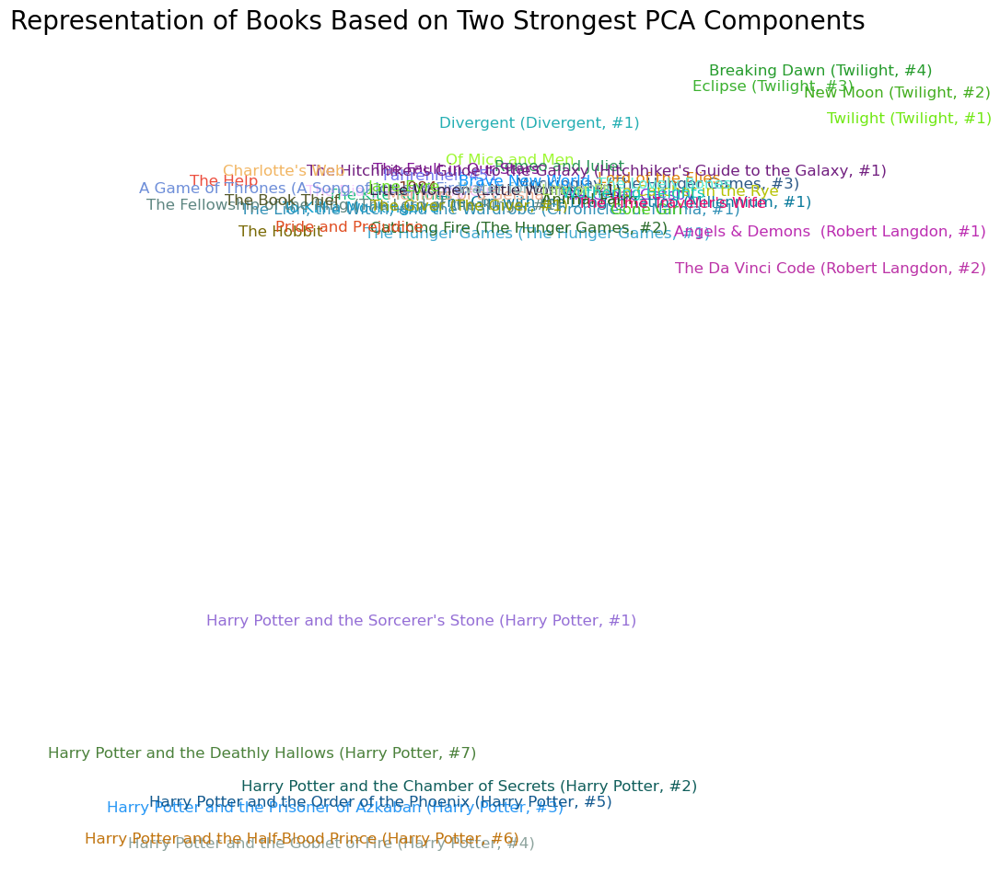

<Figure size 640x480 with 0 Axes>

In [41]:
# Find the frequency of ratings for each title
g = rated_books.groupby('title')['rating'].count()
# using the top 1000 books (byy count)
top_books = g.sort_values(ascending=False).index.values[:1000]
#get the index of these books
top_idxs = tensor([learn.dls.classes['title'].o2i[b] for b in top_books])
# Get the item weights of the top books
book_w = learn.model.i_weight.weight[top_idxs].cpu().detach()
# Get the principal components
book_pca = book_w.pca(3)
#visualize the results
fac0,fac1,fac2 = book_pca.T
idxs = list(range(50))
X = fac0[idxs]
Y = fac2[idxs]
plt.figure(figsize=(12,12))
plt.scatter(X, Y,alpha=0)
plt.axis('off')
for i, x, y in zip(top_books[idxs], X, Y):
    plt.text(x,y,i, color=np.random.rand(3), fontsize=12, stretch='expanded',family='DejaVu Sans' )
plt.title('Representation of Books Based on Two Strongest PCA Components', loc='center', fontsize=20)
plt.show()
plt.savefig('books.png');     

There is a clear similarity between the books that appear close to each other in the chart above.
In the chart there is a clear division between critically acclaimed novels and pop novels. 
The far north consists of books written by Jane Austen.
The far western part of the chart shows classic literature with the points at the south west consisting mostly of Orwellian novels. The Harry Potter series appears close to each other at the far eastern part of the plot. Below you can see a handful pop novels.

**What other pattern can you find in the chart?**

# How do we make recommendations?

A good recommendation based on a particular book would be a book similar to a that book. I wou If two books that are identical, their embedding vectors would also have to be nearly identical, because the users who would like them would be also identical. And that directly means that the distance between two movies’ embedding vectors can define that similarity. 

One of way to calculate the distance in data science and statistics is consine simuilarity. We can use this to calculate the distance between the weight of the book and that of others. The top recommendation would be the one with lowest distance.

In [42]:
# create a function that recommends books using the item weights
def similar_books(books):
    # Get the Latent Factors (Weight) of the books
    book_factors = learn.model.i_weight.weight
    
    idx = dls.classes['title'].o2i[books]
    distances = nn.CosineSimilarity(dim=1)(book_factors, book_factors[idx][None])
    idx = distances.argsort(descending=True)[:5]
    return list(dls.classes['title'][idx])

# Let's use  one of my all time favourite books as an 
p_and_p = 'Pride and Prejudice'
           
print(f" Books Similar to {p_and_p} \n {(similar_books(p_and_p))}")

 Books Similar to Pride and Prejudice 
 ['Pride and Prejudice', 'The Chronicles of Narnia (Chronicles of Narnia, #1-7)', 'Cradle to Cradle: Remaking the Way We Make Things', 'Embroideries', 'Not a Penny More, Not a Penny Less']


The model recommends other Victorian era literature to lovers of Jane Austen's Pride and Prejudice. The recommendation mosconsists of books written by Jane Austen.

In [43]:
rated_books.loc[rated_books["title"].isin(similar_books(p_and_p)), :]['authors'].unique()

array(['C.S. Lewis, Pauline Baynes', 'Jane Austen',
       'William McDonough, Michael Braungart', 'Jeffrey Archer',
       'Marjane Satrapi, Anjali Singh'], dtype=object)

With this, we can say the model gave a good enough recommendation.

# Key Findings

* Ratings for Goodread books are generally positive.


* J.K. Rowling and Mary GrandPre are the most popular authors.


* عباس معروفی and Hafez are the least popular authors.


* User 33065 is the most active user.


* Inactive and active users tends to give positive reviews.


*  Books in the Calvin and Hobbes series has the highest average ratings.


* James Redfield is the author with the highest ratings.


* Books in the Harry Potter Series are loved by all. Irrespective of user preference, users are shown to receive Harry Potter positively. That is, even if users who do not like young adult fantasy enjoy Harry Potter.


* User 53293 has the highest positive bias. That is, the user likes bokes generally irrespective of the genre, date of publication, author and so on.

# Conclusion

* Recommendation systems are used by companies to recommend items to users. 

* Collaborative filtering can be used to create a recommendation engine by recommending similar items to user. 

* Probabilistic Matrix Function recommends items to users  by matching the unknown preference of the user with the unknown characteristic of an item.

* The bias and hidden characteristics/ prefrence of an item/user can be be obtained using embedding matrices which can further be used to generate deep insight about user preference and hidden characteristics of item.

* The bias can tell us about the books that are loved by both fans  and non-fans of the genre.



# Next Steps

Now that you know how various applications recommends item to you, you can be rest assured that you did not get that Youtube ads that was a perfect fit for your situation at the time because "Big Tech" have been spying on you. 

There is a more general class of problems that this approach can solve, not necessarily involving users and products. Indeed, for collaborative filtering, we more commonly refer to items, rather than products. Items could be links that people click, diagnoses that are selected for patients, and so forth.The technique does not only apply to ratings, it applies to anything that requires a match. For example, medical diagnosis, drug prescriptions, clicks on a website/ad, friends suggestion (as seen in facebook), social media feeds and so on. 

You can extend the knowledge gotten from this notebook to any of the problems identified above (who knows? that can be your next project or startup).

The contents of this notebook is based on the lesson from [Fastai's Pratical Deep Learning Course by @jhoward](https://course.fast.ai/) which shows an example of movie recommendation.

# REFERENCES

Be added in a future version of the notebook.

We'll also be adding the ethical consideration and disadvantage of the recommendation systems